A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

 

The company wants to know:

- Which variables are significant in predicting the price of a house, and

- How well those variables describe the price of a house.

 

Also, determine the optimal value of lambda for ridge and lasso regression.

**Import scientific computation and datastructure Libraries** 

In [118]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

**Import visualisation Libraries**

In [119]:
import matplotlib.pyplot as plt
import seaborn as sns

**Import Sckit learn Libraries**

In [120]:
import sklearn
from sklearn.model_selection import GridSearchCV,train_test_split
from sklearn.linear_model import Lasso,LinearRegression,Ridge
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error,r2_score

**Import OS (OperatingSystem) library**

In [121]:
import os

**Data Reading and Understanding**

In [122]:
pd.set_option('display.max_columns',100)
fdf=pd.read_csv('train.csv')
fdf.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [123]:
fdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [124]:
!pip install sweetviz

Defaulting to user installation because normal site-packages is not writeable


In [95]:
# import sweetviz as sv
# sweet_viz=sv.analyze(fdf,pairwise_analysis='Off')
# sweet_viz.show_html('fdf_sweetreport.html')

                                             |                                             | [  0%]   00:00 ->…

Report fdf_sweetreport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [96]:
np.__version__

'1.26.0'

In [97]:
# sweet_viz1=sv.analyze(fdf,pairwise_analysis='On')
# sweet_viz1.show_html('fdf_sweetreport.html')

                                             |                                             | [  0%]   00:00 ->…

Report fdf_sweetreport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [98]:
# sweet_viz2=sv.analyze(fdf,target_feat='SalePrice')
# sweet_viz2.show_html('fdf_sweetreport.html')

                                             |                                             | [  0%]   00:00 ->…

Report fdf_sweetreport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


                                             |                                             | [  0%]   00:00 ->…


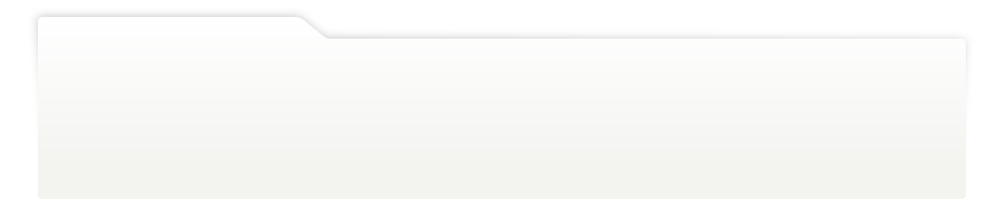
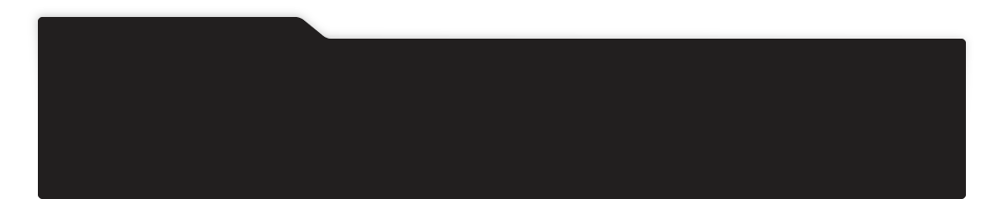
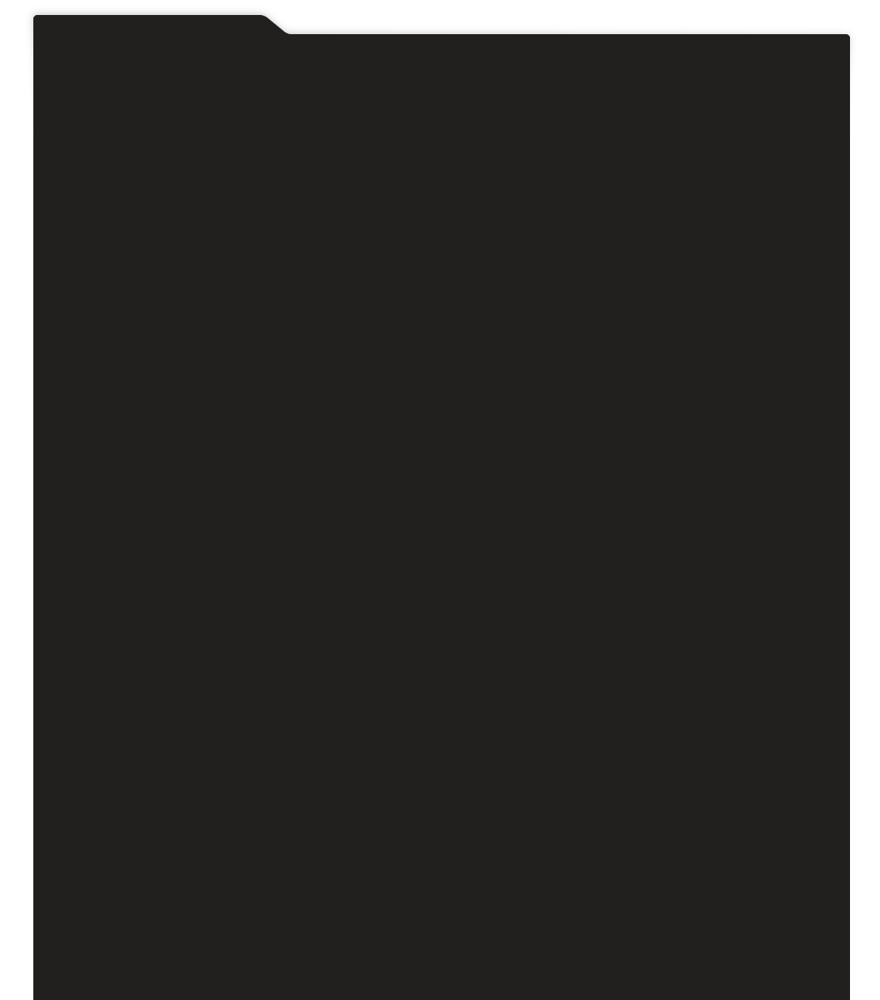
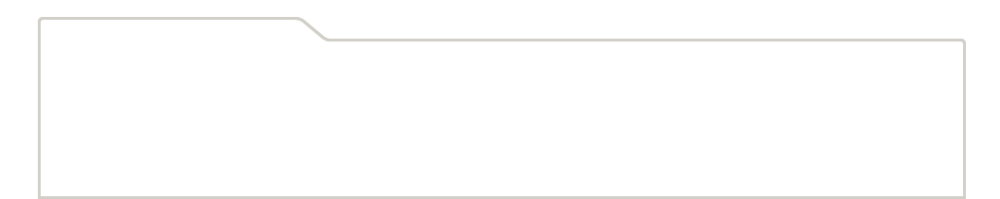
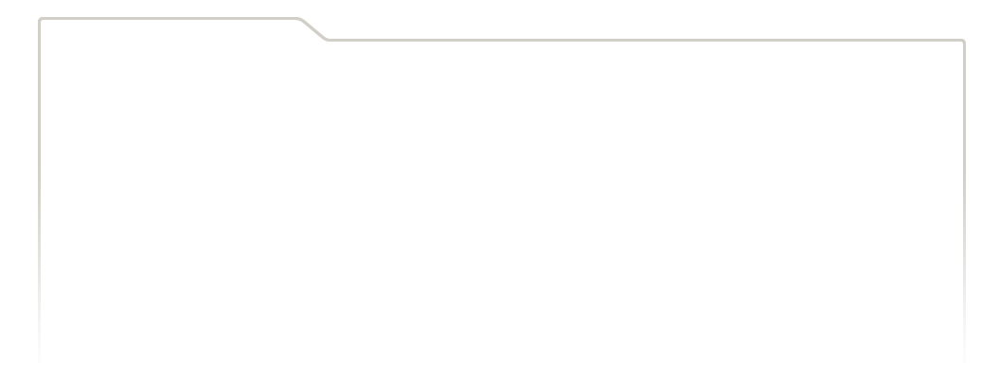
...
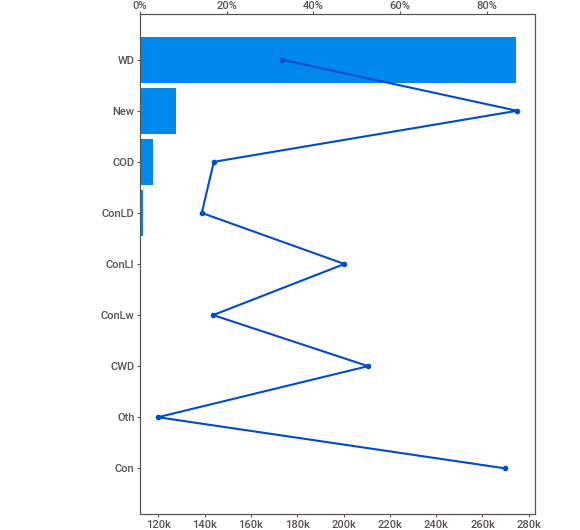
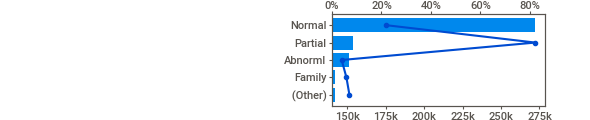
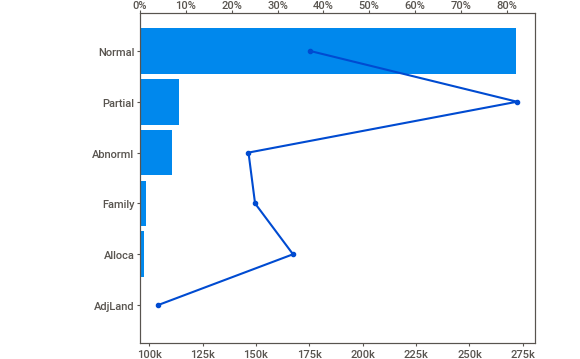
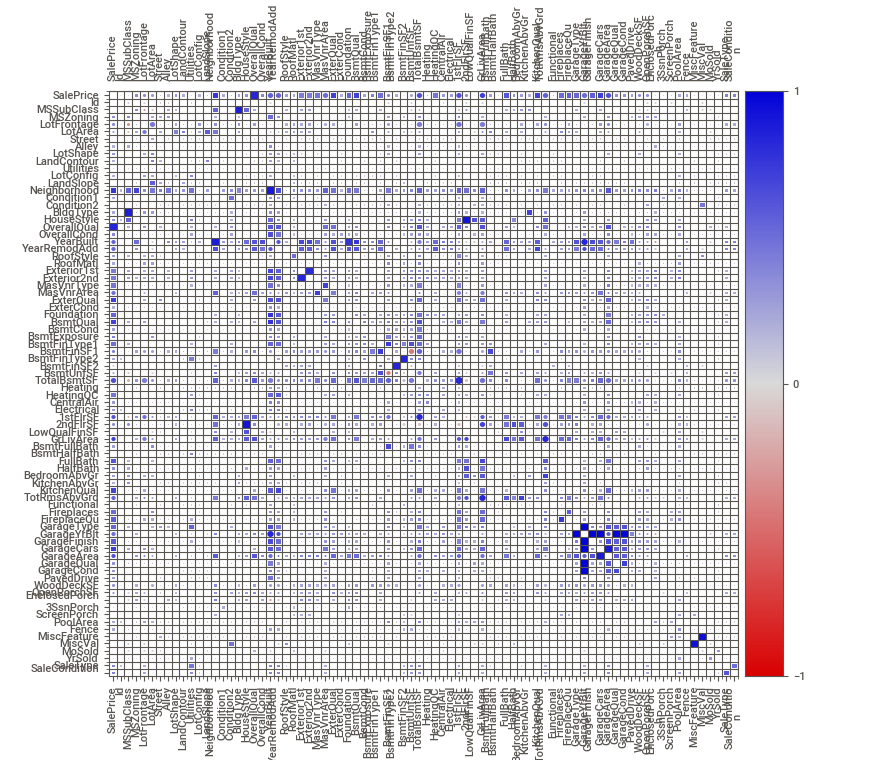
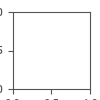

In [99]:
# sweet_viz2=sv.analyze(fdf,target_feat='SalePrice')
# sweet_viz2.show_notebook(w='100%',h='Full')

##

**As we found from data information that few of columns have missing NA values, Which should be removed or impute them according to the importance and types needed**

In [125]:
pd.options.display.max_rows=100
fdf.isnull().sum().sort_values(ascending=False)

PoolQC           1453
MiscFeature      1406
Alley            1369
Fence            1179
FireplaceQu       690
LotFrontage       259
GarageYrBlt        81
GarageCond         81
GarageType         81
GarageFinish       81
GarageQual         81
BsmtFinType2       38
BsmtExposure       38
BsmtQual           37
BsmtCond           37
BsmtFinType1       37
MasVnrArea          8
MasVnrType          8
Electrical          1
Id                  0
Functional          0
Fireplaces          0
KitchenQual         0
KitchenAbvGr        0
BedroomAbvGr        0
HalfBath            0
FullBath            0
BsmtHalfBath        0
TotRmsAbvGrd        0
GarageCars          0
GrLivArea           0
GarageArea          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
BsmtFullBath        0
HeatingQC 

In [126]:
print(fdf.MasVnrArea.value_counts())
print(fdf.MasVnrType.value_counts())

0.0      861
180.0      8
72.0       8
108.0      8
120.0      7
        ... 
562.0      1
89.0       1
921.0      1
762.0      1
119.0      1
Name: MasVnrArea, Length: 327, dtype: int64
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64


In [127]:
print(fdf.BsmtQual.value_counts(dropna=False))
print(fdf.BsmtCond.value_counts(dropna=False))

TA     649
Gd     618
Ex     121
NaN     37
Fa      35
Name: BsmtQual, dtype: int64
TA     1311
Gd       65
Fa       45
NaN      37
Po        2
Name: BsmtCond, dtype: int64


In [128]:
print(fdf.BsmtFinType1.value_counts(dropna=False))
print(fdf.BsmtFinType2.value_counts(dropna=False))
print(fdf.BsmtExposure.value_counts(dropna=False))

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NaN     37
Name: BsmtFinType1, dtype: int64
Unf    1256
Rec      54
LwQ      46
NaN      38
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
No     953
Av     221
Gd     134
Mn     114
NaN     38
Name: BsmtExposure, dtype: int64


### Insight
**From the above we infer that top 11 columns having highest Null values, lets impute them with appropriate values** 

In [108]:
for i in num_count:
    print(fdf[i].value_counts())

1       1
982     1
980     1
979     1
978     1
       ..
485     1
484     1
483     1
482     1
1460    1
Name: Id, Length: 1460, dtype: int64
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
        ... 
137.0      1
141.0      1
38.0       1
140.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64
7200     25
9600     24
6000     17
9000     14
8400     14
         ..
14601     1
13682     1
4058      1
17104     1
9717      1
Name: LotArea, Length: 1073, dtype: int64
5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64
5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64
2006    67
2005    64
2004    54
2007    49
2003  

In [129]:
fdf_null=["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]

In [132]:
for i in fdf_null:
    fdf[i].fillna('None',inplace=True)

In [133]:
fdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### Imputing Real 'Nan' values 
**These are the real Nan value which we have to deal with which were not recorded**

In [134]:
total=fdf.isnull().sum().sort_values(ascending=False)
percent= (fdf.isnull().sum()/len(fdf.isnull().index)).sort_values(ascending=False)
miss_data=pd.concat([total,percent],axis=1,keys=['Total','Percentage'])
miss_data.head(10)

,Total,Percentage
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
MasVnrType,8,0.005479
MasVnrArea,8,0.005479
Electrical,1,0.000685
KitchenQual,0,0.000000
GarageType,0,0.000000
FireplaceQu,0,0.000000
Fireplaces,0,0.000000
Functional,0,0.000000


**LotFrontage has too many Null values and it is a numerical value so it may be better to just drop it.**

In [137]:
fdf.drop("LotFrontage", axis=1, inplace=True)

GarageYrBlt, MasVnrArea, and MasVnrType all have a fairly decent amount of missing values. MasVnrType is categorical so we can replace the missing values with "None", as we did before. We can fill the others with median.

In [139]:
fdf["GarageYrBlt"].fillna(fdf["GarageYrBlt"].median(), inplace=True)
fdf["MasVnrArea"].fillna(fdf["MasVnrArea"].median(), inplace=True)
fdf["MasVnrType"].fillna("None", inplace=True)

In [140]:
total=fdf.isnull().sum().sort_values(ascending=False)
percent= (fdf.isnull().sum()/len(fdf.isnull().index)).sort_values(ascending=False)
miss_data=pd.concat([total,percent],axis=1,keys=['Total','Percentage'])
miss_data.head(10)

,Total,Percentage
Electrical,1,0.000685
MSSubClass,0,0.000000
GarageYrBlt,0,0.000000
GarageType,0,0.000000
FireplaceQu,0,0.000000
Fireplaces,0,0.000000
Functional,0,0.000000
TotRmsAbvGrd,0,0.000000
KitchenQual,0,0.000000
KitchenAbvGr,0,0.000000


In [141]:
fdf=fdf.dropna()

In [143]:
fdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1459 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1459 non-null   object 
 3   LotArea        1459 non-null   int64  
 4   Street         1459 non-null   object 
 5   Alley          1459 non-null   object 
 6   LotShape       1459 non-null   object 
 7   LandContour    1459 non-null   object 
 8   Utilities      1459 non-null   object 
 9   LotConfig      1459 non-null   object 
 10  LandSlope      1459 non-null   object 
 11  Neighborhood   1459 non-null   object 
 12  Condition1     1459 non-null   object 
 13  Condition2     1459 non-null   object 
 14  BldgType       1459 non-null   object 
 15  HouseStyle     1459 non-null   object 
 16  OverallQual    1459 non-null   int64  
 17  OverallCond    1459 non-null   int64  
 18  YearBuil

#

## Insights
**Missing values been replaced all Nan values wiht None and other remaining replaced with median value**

                                             |                                             | [  0%]   00:00 ->…


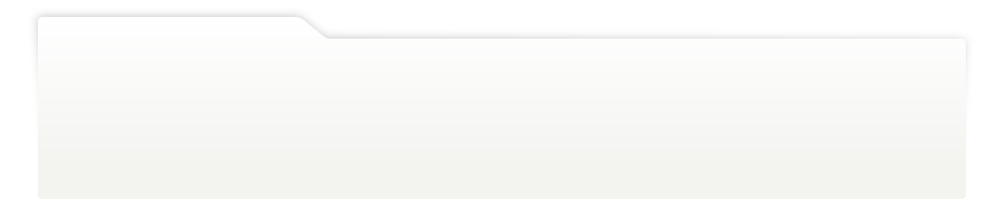
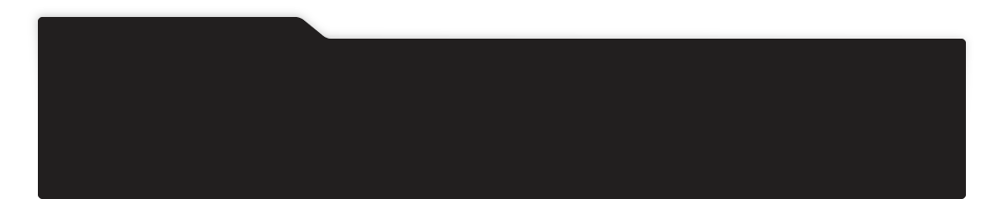
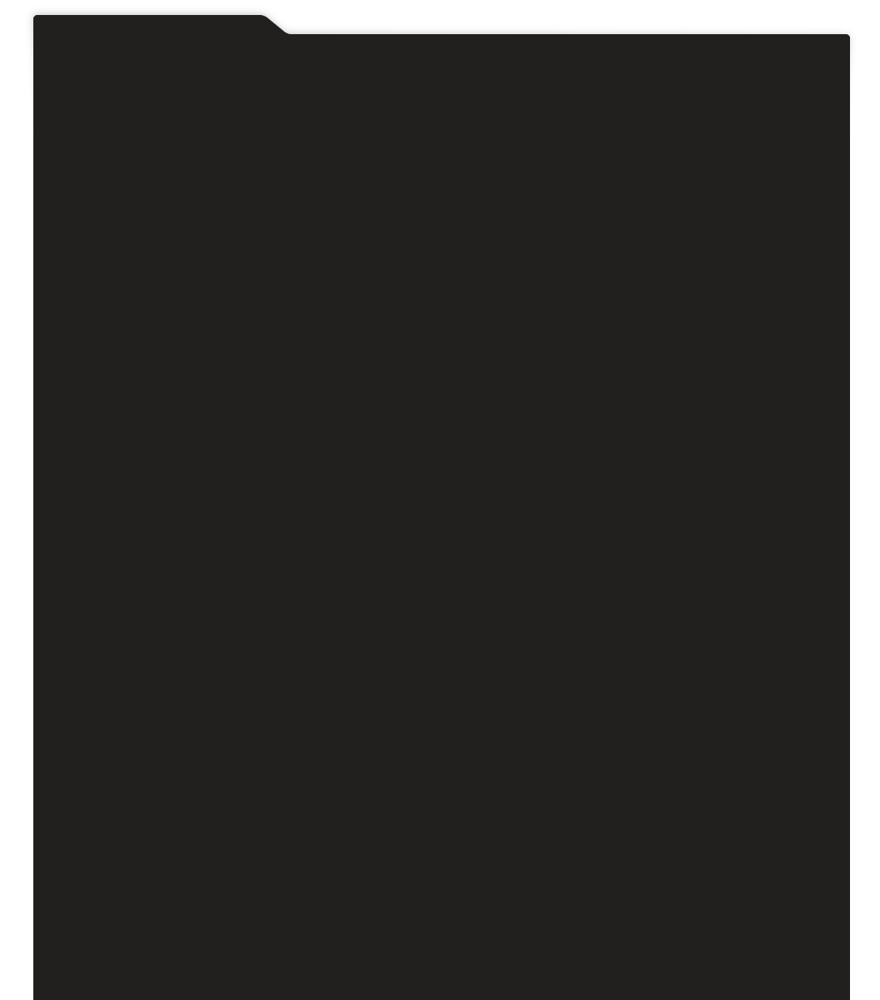
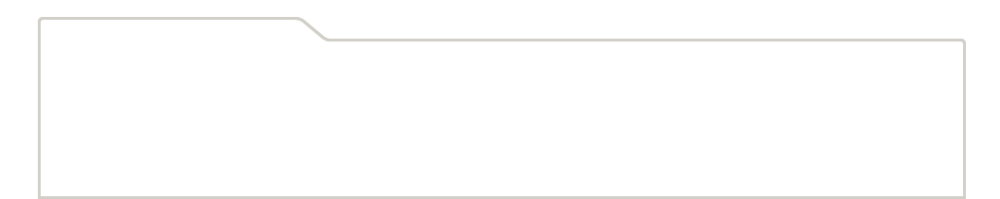
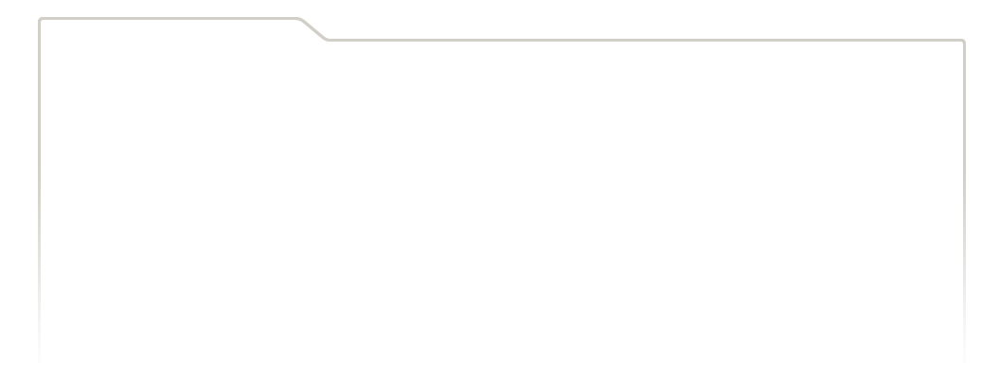
...
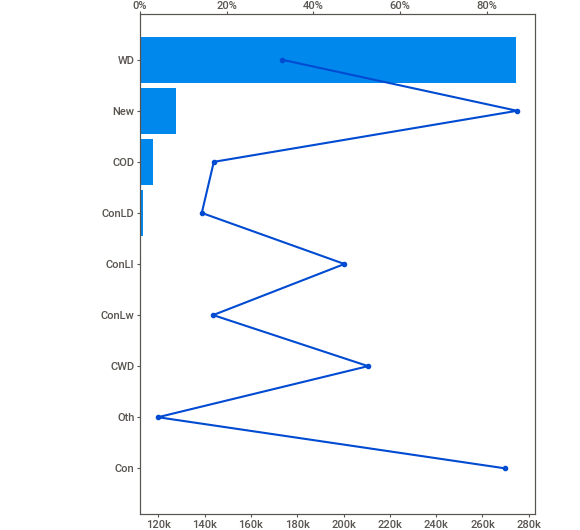
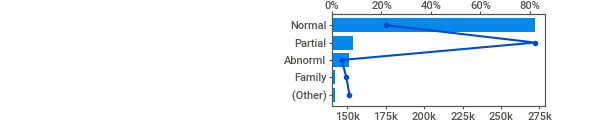
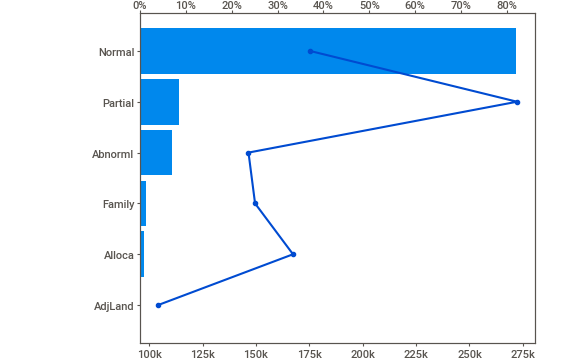
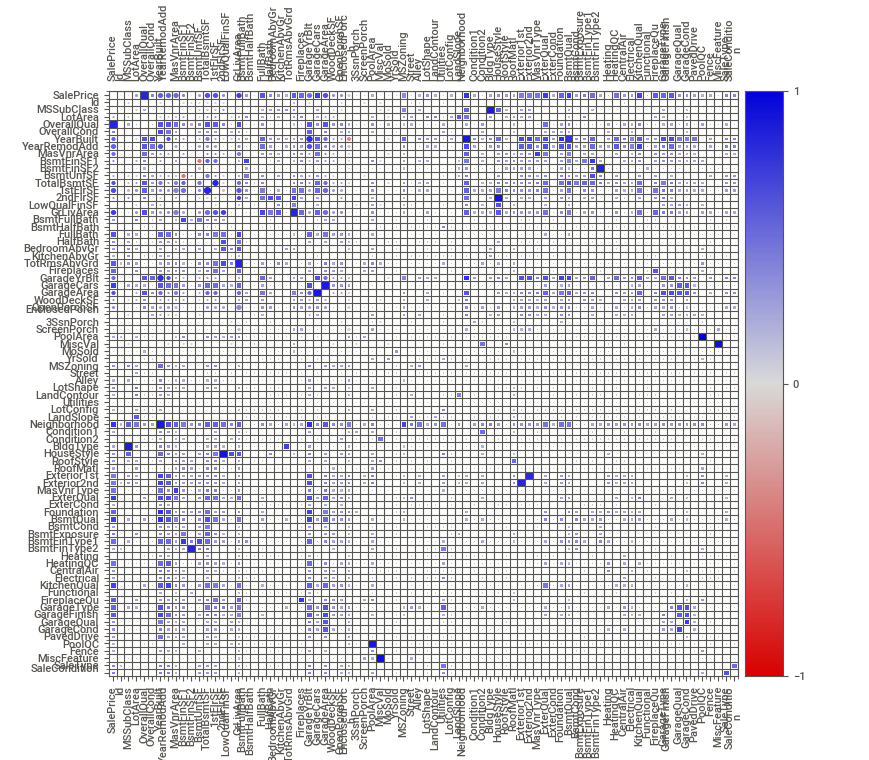
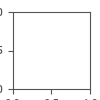

In [160]:
sweet_viz3=sv.analyze(fdf1,target_feat='SalePrice')
sweet_viz3.show_notebook(w='100%',h='Full')

In [145]:
n=fdf.select_dtypes(include='object')
var=[]
for i in n:
    if(fdf[i].value_counts().max() >= (1459*0.85)):
        var.append(i)
print(len(var))
print(var)
    

21
['Street', 'Alley', 'LandContour', 'Utilities', 'LandSlope', 'Condition1', 'Condition2', 'RoofMatl', 'ExterCond', 'BsmtCond', 'BsmtFinType2', 'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'MiscFeature', 'SaleType']


#

### Data Visualisation

<Axes: xlabel='SalePrice', ylabel='Density'>

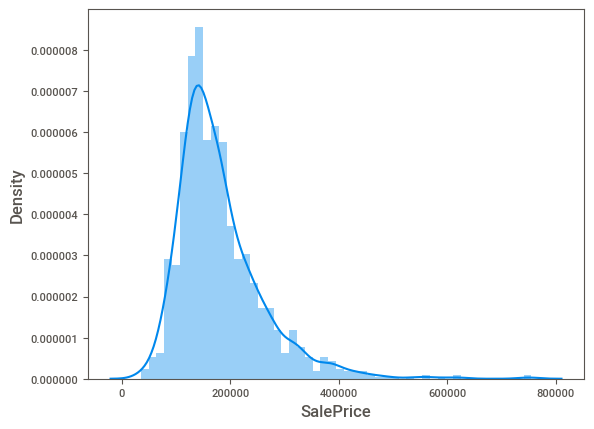

In [147]:
sns.distplot(fdf['SalePrice'],bins=50)

In [148]:
fdf.describe()

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,730.054832,56.881426,10517.363948,6.100069,5.575737,1971.244003,1984.850583,103.187800,443.943797,46.581220,567.366004,1057.891021,1162.906785,346.791638,5.848526,1515.546950,0.425634,0.057574,1.564770,0.382454,2.866347,1.046607,6.517478,0.613434,1978.569568,1.766964,473.030158,94.240576,46.692255,21.969157,3.411926,15.071282,2.760795,43.518849,6.322824,2007.815627,180930.394791
std,421.411181,42.310746,9984.666267,1.383171,1.113079,30.199555,20.644343,180.773158,456.106417,161.369977,441.992392,438.500975,386.572089,436.610637,48.639512,525.650927,0.518969,0.238830,0.550987,0.502798,0.816050,0.220410,1.625902,0.644687,23.993708,0.747546,213.869604,125.381679,66.267472,61.137400,29.327247,55.775138,40.191018,496.291826,2.704331,1.328542,79468.964025
min,1.000000,20.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.500000,20.000000,7549.000000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.000000,0.000000,0.000000,1129.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,333.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129950.000000
50%,730.000000,50.000000,9477.000000,6.000000,5.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,479.000000,992.000000,1088.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1094.500000,70.000000,11603.000000,7.000000,6.000000,2000.000000,2004.000000,164.500000,712.500000,0.000000,808.000000,1298.500000,1391.500000,728.000000,0.000000,1777.500000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [149]:
fdf.corr()

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.010589,-0.033170,-0.027553,0.013167,-0.013945,-0.023158,-0.050515,-0.004001,-0.005668,-0.007508,-0.013815,0.011627,0.004885,-0.044139,0.008524,0.003158,-0.019917,0.004758,0.005494,0.037577,0.003177,0.026948,-0.018788,-0.001375,0.016254,0.018010,-0.029716,0.000267,0.003272,-0.046550,0.001617,0.057163,-0.006155,0.021708,0.000566,-0.021756
MSSubClass,0.010589,1.000000,-0.139766,0.032936,-0.059134,0.027435,0.040199,0.023792,-0.069501,-0.065549,-0.140627,-0.238160,-0.251484,0.307713,0.046524,0.074949,0.003799,-0.002243,0.131354,0.177004,-0.023502,0.281833,0.040274,-0.045232,0.081000,-0.040232,-0.098558,-0.012598,-0.005838,-0.011904,-0.043786,-0.025932,0.008309,-0.007651,-0.013404,-0.021461,-0.084230
LotArea,-0.033170,-0.139766,1.000000,0.105786,-0.005665,0.014296,0.013852,0.103302,0.214121,0.111158,-0.002641,0.260962,0.299533,0.051030,0.004773,0.263109,0.158147,0.048034,0.126100,0.014333,0.119700,-0.017796,0.190037,0.271398,-0.025813,0.154893,0.180392,0.171701,0.084751,-0.018360,0.020417,0.043147,0.077669,0.038063,0.001179,-0.014254,0.263837
OverallQual,-0.027553,0.032936,0.105786,1.000000,-0.092243,0.573334,0.551605,0.407075,0.239265,-0.059291,0.308018,0.537523,0.475933,0.295969,-0.030502,0.593021,0.110700,-0.040291,0.551267,0.274328,0.101789,-0.184040,0.427720,0.396455,0.515236,0.600991,0.561980,0.239000,0.308554,-0.114162,0.030314,0.064755,0.065143,-0.031461,0.070570,-0.027277,0.791069
OverallCond,0.013167,-0.059134,-0.005665,-0.092243,1.000000,-0.375780,0.074158,-0.125922,-0.046595,0.040132,-0.137008,-0.171796,-0.144646,0.029187,0.025454,-0.079777,-0.055250,0.117749,-0.193929,-0.060371,0.013039,-0.087085,-0.057485,-0.024167,-0.306031,-0.185670,-0.151662,-0.003318,-0.032847,0.070238,0.025465,0.054721,-0.002009,0.068752,-0.003685,0.044003,-0.077924
YearBuilt,-0.013945,0.027435,0.014296,0.573334,-0.375780,1.000000,0.592512,0.312227,0.250465,-0.048903,0.149444,0.393159,0.283056,0.009784,-0.183774,0.199286,0.188374,-0.037990,0.467960,0.241923,-0.070813,-0.174715,0.095401,0.148580,0.776974,0.537866,0.479460,0.224946,0.189359,-0.387177,0.031461,-0.050175,0.005006,-0.034330,0.012791,-0.013733,0.523273
YearRemodAdd,-0.023158,0.040199,0.013852,0.551605,0.074158,0.592512,1.000000,0.177038,0.129259,-0.067575,0.181520,0.292546,0.241344,0.139607,-0.062356,0.287677,0.120148,-0.012165,0.438733,0.182595,-0.040718,-0.149503,0.191603,0.113360,0.616113,0.420573,0.372012,0.205773,0.226944,-0.193740,0.045389,-0.038558,0.005882,-0.010226,0.021860,0.035656,0.507430
MasVnrArea,-0.050515,0.023792,0.103302,0.407075,-0.125922,0.312227,0.177038,1.000000,0.260989,-0.071453,0.113719,0.359798,0.339605,0.174109,-0.068683,0.388012,0.082718,0.027312,0.273397,0.199713,0.102851,-0.038538,0.279724,0.246747,0.245053,0.362119,0.370807,0.160026,0.122287,-0.110065,0.019100,0.062151,0.011903,-0.029550,-0.006916,-0.008263,0.472606
BsmtFinSF1,-0.004001,-0.069501,0.214121,0.239265,-0.046595,0.250465,0.129259,0.260989,1.000000,-0.050328,-0.495718,0.521963,0.445473,-0.136697,-0.064604,0.208088,0.649025,0.067281,0.059102,0.005085,-0.107281,-0.081175,0.044529,0.259541,0.149693,0.224342,0.296851,0.204403,0.111346,-0.102581,0.026382,0.061862,0.140491,0.003514,-0.016060,0.014456,0.386436
BsmtFinSF2,-0.005668,-0.065549,0.111158,-0.059291,0.040132,-0.048903,-0.067575,-0.071453,-0.050328,1.000000,-0.209395,0.104593,0.096948,-0.099146,0.014784,-0.009686,0.158557,0.070904,-0.076306,-0.031922,-0.015696,-0.040795,-0.035170,0.046748,-0.087494,-0.038204,-0.018295,0.067909,0.002954,0.036475,-0.030017,0.088823,0.041697,0.004923,-0.015309,0.031734,-0.011412


<Axes: >

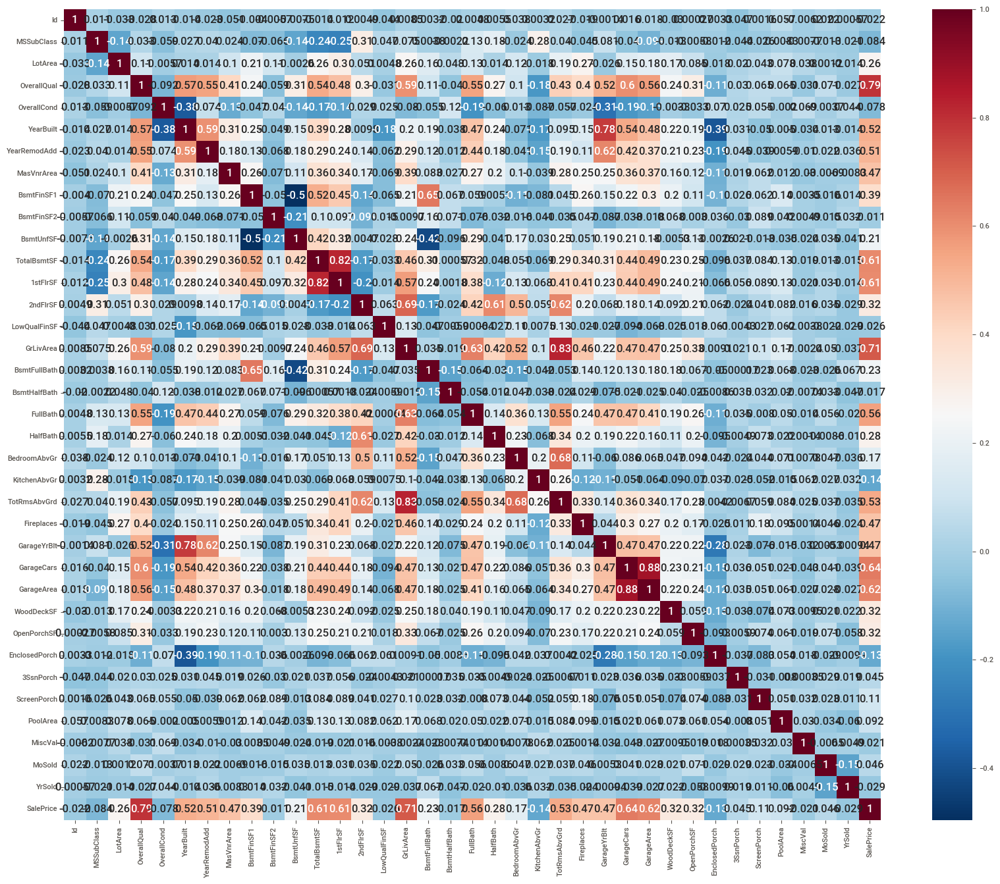

In [150]:
plt.figure(figsize=(20,16))
sns.heatmap(fdf.corr(), cmap='RdBu_r',annot=True)

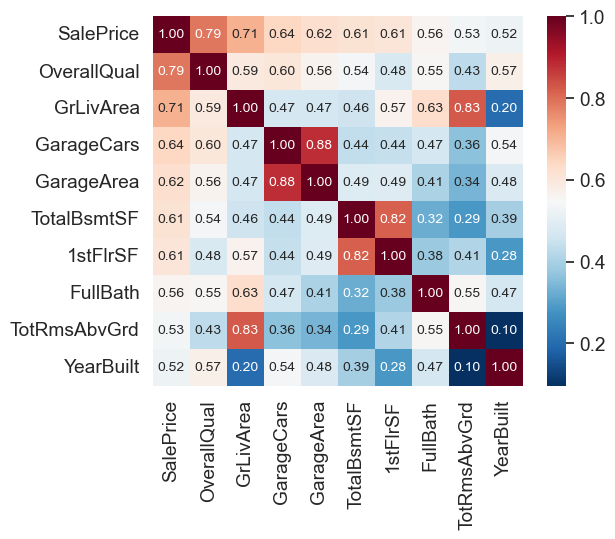

In [152]:
corrmat=fdf.corr()
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(fdf[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cmap='RdBu_r', cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

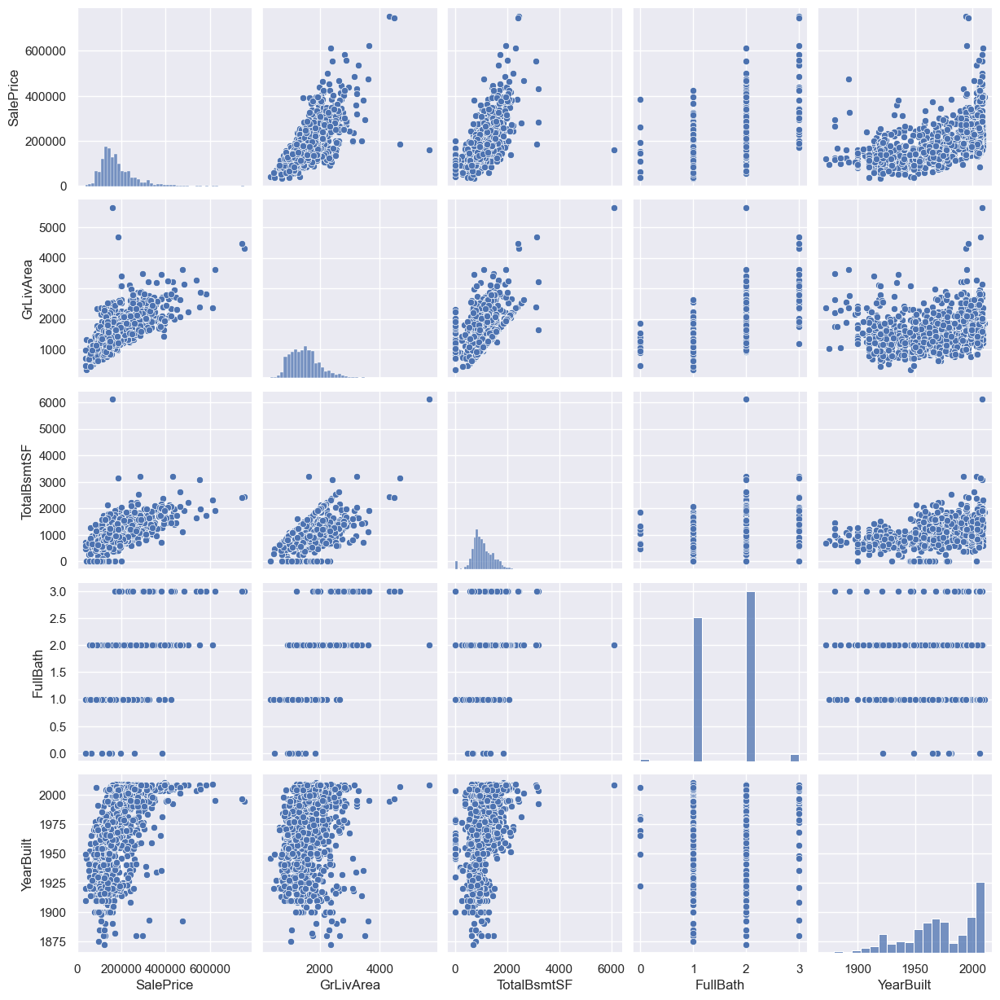

In [153]:
sns.set()
cols = ['SalePrice', 'GrLivArea', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(fdf[cols], size = 2.5)
plt.show();

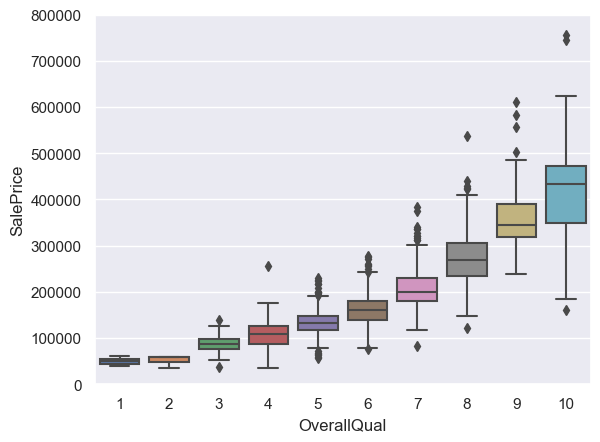

In [154]:
fig = sns.boxplot(x='OverallQual', y="SalePrice", data=fdf)
fig.axis(ymin=0, ymax=800000);

## Insights
**As the quality of increases the value of house price increases**

#

**We derive the new value as year which how age of the house**

In [155]:
fdf.YearBuilt.dtype
fdf.YrSold.dtype

dtype('int64')

In [157]:
fdf['ActualAge']=fdf['YrSold']-fdf['YearBuilt']
fdf.ActualAge

0        5
1       31
2        7
3       91
4        8
        ..
1455     8
1456    32
1457    69
1458    60
1459    43
Name: ActualAge, Length: 1459, dtype: int64

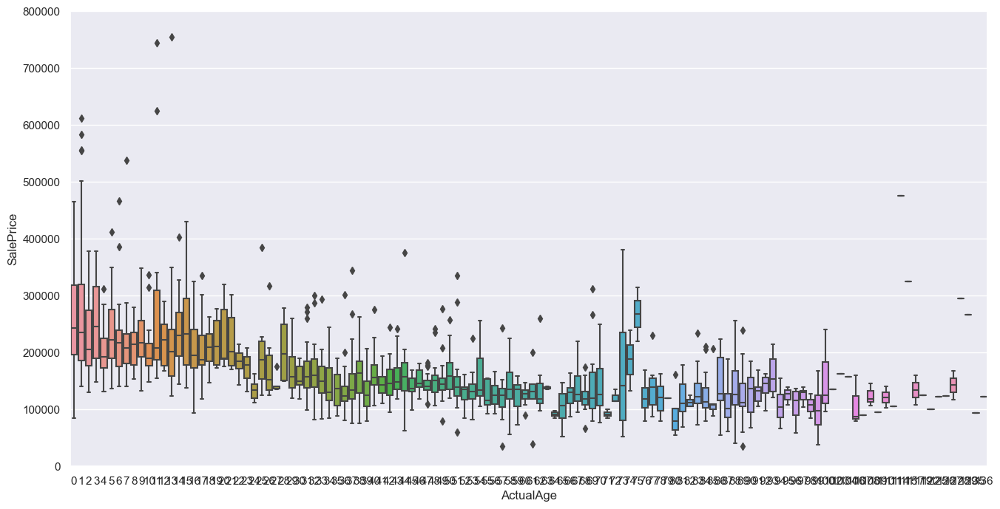

In [158]:
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x='ActualAge', y="SalePrice", data=fdf)
fig.axis(ymin=0, ymax=800000);

### Insights 
- **As the age houses increases the value of price drecreases** 

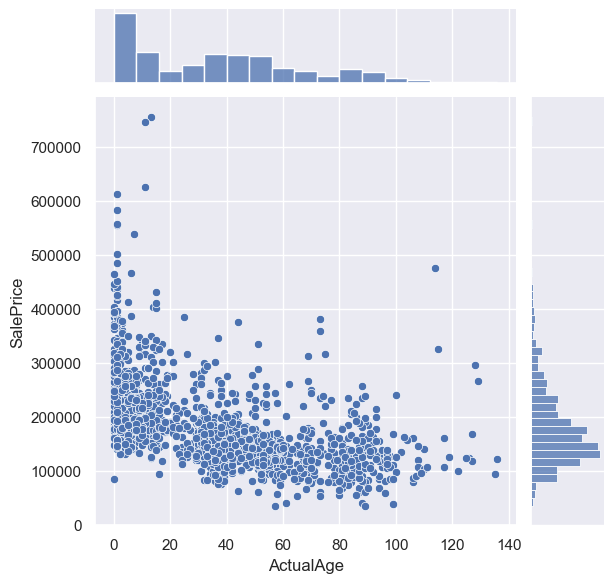

In [159]:
sns.jointplot(x = fdf['ActualAge'], y = fdf['SalePrice'])
plt.show()

**Now we can drop the column Month sold and Year Sold, Year built and Year remodelled since it will not be required further**

In [160]:
fdf = fdf.drop(['MoSold'], axis = 1)
fdf = fdf.drop(['YrSold'], axis = 1)
fdf = fdf.drop(['YearBuilt'], axis = 1)
fdf = fdf.drop(['YearRemodAdd'], axis = 1)
fdf.head()

,Id,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,SalePrice,ActualAge
0,1,60,RL,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,WD,Normal,208500,5
1,2,20,RL,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,WD,Normal,181500,31
2,3,60,RL,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,WD,Normal,223500,7
3,4,70,RL,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,WD,Abnorml,140000,91
4,5,60,RL,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,WD,Normal,250000,8


In [165]:
cat=fdf.select_dtypes(include='object').columns.tolist()

In [166]:
for i in cat:
    print(fdf[i].value_counts())

RL         1150
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
Pave    1453
Grvl       6
Name: Street, dtype: int64
None    1368
Grvl      50
Pave      41
Name: Alley, dtype: int64
Reg    924
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
Lvl    1310
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
AllPub    1458
NoSeWa       1
Name: Utilities, dtype: int64
Inside     1051
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
Gtl    1381
Mod      65
Sev      13
Name: LandSlope, dtype: int64
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
IDOTRR      37
Timber      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Nei

In [198]:
n=fdf.select_dtypes(include='object')
lvar=[]
for i in n:
    if(fdf[i].value_counts().max() >= (1459*0.95)):
        lvar.append(i)
print(len(lvar))
print(lvar)

7
['Street', 'Utilities', 'Condition2', 'RoofMatl', 'Heating', 'PoolQC', 'MiscFeature']


In [199]:
na=fdf.select_dtypes(include='object')
lwvar=[]
for i in n:
    if(fdf[i].value_counts().max() >= (1459*0.90)):
        lwvar.append(i)
print(len(lwvar))
print(lwvar)

14
['Street', 'Alley', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageCond', 'PavedDrive', 'PoolQC', 'MiscFeature']


**As per discussion the above columns show little variance which we can drop these columns**

In [200]:
lvar

['Street',
 'Utilities',
 'Condition2',
 'RoofMatl',
 'Heating',
 'PoolQC',
 'MiscFeature']

In [201]:
fdf.drop(lvar, axis=1)

,Id,MSSubClass,MSZoning,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,SaleType,SaleCondition,SalePrice,ActualAge
0,1,60,RL,8450,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,0,WD,Normal,208500,5
1,2,20,RL,9600,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,0,WD,Normal,181500,31
2,3,60,RL,11250,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,0,WD,Normal,223500,7
3,4,70,RL,9550,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,0,WD,Abnorml,140000,91
4,5,60,RL,14260,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,0,WD,Normal,250000,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,7917,None,Reg,Lvl,Inside,Gtl,Gilbert,Norm,1Fam,2Story,6,5,Gable,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,None,0,WD,Normal,175000,8
1456,1457,20,RL,13175,None,Reg,Lvl,Inside,Gtl,NWAmes,Norm,1Fam,1Story,6,6,Gable,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,MnPrv,0,WD,Normal,210000,32
1457,1458,70,RL,9042,None,Reg,Lvl,Inside,Gtl,Crawfor,Norm,1Fam,2Story,7,9,Gable,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,GdPrv,2500,WD,Normal,266500,69
1458,1459,20,RL,9717,None,Reg,Lvl,Inside,Gtl,NAmes,Norm,1Fam,1Story,5,6,Hip,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,None,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,None,0,WD,Normal,142125,60


In [210]:
fdf1=fdf.drop(lwvar,axis=1)

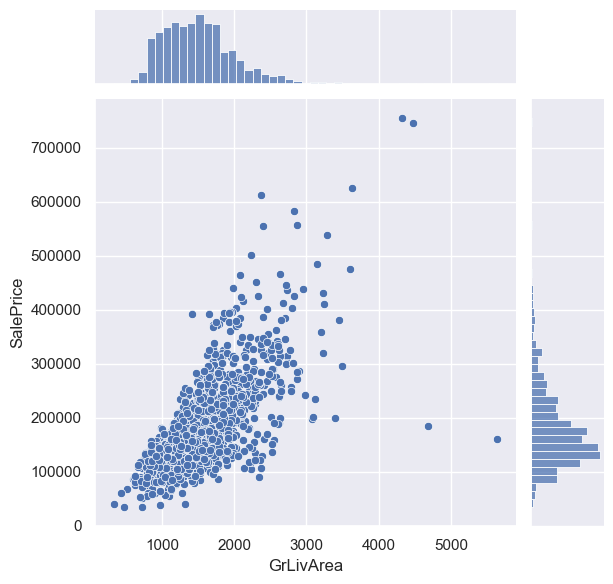

In [211]:
# Again plotting GeLivArea vs SalePrice
sns.jointplot(x = fdf1['GrLivArea'], y = fdf1['SalePrice'])
plt.show()

# Data Preparation

**As we see the distribution of SalePrice is RightSkewed as more seems to be Outliers**

<Axes: xlabel='SalePrice', ylabel='Density'>

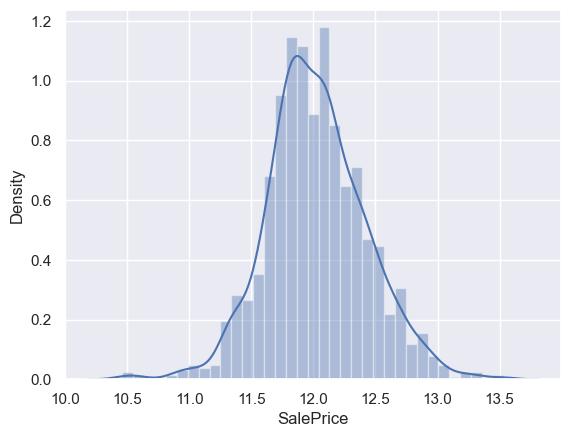

In [212]:
sns.distplot(np.log(fdf1["SalePrice"]))

In [213]:
fdf1['LogSalePrice']=np.log(fdf1['SalePrice'])

In [214]:
fdf1=fdf1.drop('Id',axis=1)
fdf1.shape

(1459, 63)

In [216]:
pd.options.display.max_columns=100
fdf1.head()

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,SaleType,SaleCondition,SalePrice,ActualAge,LogSalePrice
0,60,RL,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,Ex,856,854,0,1710,1,0,2,1,3,1,Gd,8,0,None,Attchd,2003.0,RFn,2,548,TA,0,61,0,0,0,0,None,0,WD,Normal,208500,5,12.247694
1,20,RL,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,Ex,1262,0,0,1262,0,1,2,0,3,1,TA,6,1,TA,Attchd,1976.0,RFn,2,460,TA,298,0,0,0,0,0,None,0,WD,Normal,181500,31,12.109011
2,60,RL,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,Ex,920,866,0,1786,1,0,2,1,3,1,Gd,6,1,TA,Attchd,2001.0,RFn,2,608,TA,0,42,0,0,0,0,None,0,WD,Normal,223500,7,12.317167
3,70,RL,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,Gd,961,756,0,1717,1,0,1,0,3,1,Gd,7,1,Gd,Detchd,1998.0,Unf,3,642,TA,0,35,272,0,0,0,None,0,WD,Abnorml,140000,91,11.849398
4,60,RL,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,Ex,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,1,TA,Attchd,2000.0,RFn,3,836,TA,192,84,0,0,0,0,None,0,WD,Normal,250000,8,12.429216


In [217]:
types_train = fdf1.dtypes #type of each feature in data: int, float, object
num_train = types_train[(types_train == 'int64') | (types_train == float)] #numerical values are either type int or float
cat_train = types_train[types_train == object] #categorical values are type object

In [218]:
pd.DataFrame(types_train).reset_index().set_index(0).reset_index()[0].value_counts()

int64      31
object     29
float64     3
Name: 0, dtype: int64

In [219]:
numerical_values_train = list(num_train.index)
print(numerical_values_train)

['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice', 'ActualAge', 'LogSalePrice']


In [220]:
categorical_values_train = list(cat_train.index)
print(categorical_values_train)

['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'Fence', 'SaleType', 'SaleCondition']


In [303]:
fdf1[categorical_values_train ]=fdf1[categorical_values_train ].astype('category')

In [304]:
fdf1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1459 entries, 0 to 1459
Data columns (total 63 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1459 non-null   int64   
 1   MSZoning       1459 non-null   category
 2   LotArea        1459 non-null   int64   
 3   LotShape       1459 non-null   category
 4   LandContour    1459 non-null   category
 5   LotConfig      1459 non-null   category
 6   Neighborhood   1459 non-null   category
 7   Condition1     1459 non-null   category
 8   BldgType       1459 non-null   category
 9   HouseStyle     1459 non-null   category
 10  OverallQual    1459 non-null   int64   
 11  OverallCond    1459 non-null   int64   
 12  RoofStyle      1459 non-null   category
 13  Exterior1st    1459 non-null   category
 14  Exterior2nd    1459 non-null   category
 15  MasVnrType     1459 non-null   category
 16  MasVnrArea     1459 non-null   float64 
 17  ExterQual      1459 non-null   ca

In [305]:
fdf2=pd.get_dummies(fdf1,drop_first=True)
fdf2.shape

(1459, 207)

In [222]:
from sklearn.preprocessing import StandardScaler

In [430]:
# for i in categorical_values_train:
#     feature_set = set(fdf2[i])
#     for j in feature_set:
#         feature_list = list(feature_set)
#         fdf2.loc[fdf2[i] == j, i] = feature_list.index(j)

In [223]:
fdf2=fdf2.drop('SalePrice',axis=1)


In [ ]:
fdf2=fdf2.drop(cat)

In [224]:
mdf=fdf2.copy()
mdf.shape

(1459, 206)

In [225]:
y=fdf2.pop('LogSalePrice')
X=fdf2
print(X)
print(y)


      MSSubClass  LotArea  OverallQual  OverallCond  MasVnrArea  BsmtFinSF1  \
0             60     8450            7            5       196.0         706   
1             20     9600            6            8         0.0         978   
2             60    11250            7            5       162.0         486   
3             70     9550            7            5         0.0         216   
4             60    14260            8            5       350.0         655   
...          ...      ...          ...          ...         ...         ...   
1455          60     7917            6            5         0.0           0   
1456          20    13175            6            6       119.0         790   
1457          70     9042            7            9         0.0         275   
1458          20     9717            5            6         0.0          49   
1459          20     9937            5            6         0.0         830   

      BsmtFinSF2  BsmtUnfSF  TotalBsmtSF  1stFlrSF 

In [226]:
X.head()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,ActualAge,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,...,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,5,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,31,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,7,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
3,70,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,91,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,60,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,8,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0


#

## Split Train and Test

In [351]:
X_train, X_test, y_train, y_test = train_test_split(X , y, train_size=0.7, test_size = 0.3, random_state=100)

**Unregularized Model**

In [352]:
scaler=StandardScaler()

In [353]:
X_train[['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'ActualAge']]=scaler.fit_transform(X_train[['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'ActualAge']])
X_test[['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'ActualAge']]=scaler.transform(X_test[['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'ActualAge']])


In [354]:
X_train.head()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,ActualAge,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,...,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
984,0.787494,-0.049244,-0.790233,-0.512364,-0.555867,-0.931228,-0.299629,-1.265589,-2.274081,0.320038,0.206085,-0.123208,0.399579,-0.826986,-0.241465,0.789648,-0.755902,1.399721,4.407570,0.917605,-0.963636,-0.058581,0.302190,0.302095,-0.729730,-0.702191,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,-0.156310,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1416,3.177599,0.067048,-1.500469,0.384932,-0.555867,-0.931228,-0.299629,0.464070,-0.607802,0.179679,1.610886,-0.123208,1.449374,-0.826986,-0.241465,0.789648,-0.755902,1.399721,4.407570,2.780178,-0.963636,-0.306419,0.302190,0.399400,-0.729730,-0.702191,1.435413,-0.121132,-0.273,-0.054189,-0.077724,2.886983,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
390,-0.168548,-0.213872,-0.790233,2.179524,-0.555867,-0.422211,1.997881,-0.755819,-0.427663,-0.534650,0.146404,-0.123208,-0.293361,1.087646,-0.241465,-1.022106,-0.755902,1.399721,-0.207947,0.296747,-0.963636,-0.017275,-1.027708,-0.416110,-0.729730,1.144341,1.403785,-0.121132,-0.273,-0.054189,-0.077724,2.330682,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
877,0.070462,-0.172811,2.050710,-0.512364,0.591698,1.539931,-0.299629,-0.615576,0.861183,0.721065,0.963575,-0.123208,1.324758,1.087646,-0.241465,0.789648,1.269756,1.399721,-0.207947,2.159320,0.578484,1.056689,1.632089,1.224177,0.708584,-0.702191,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,-1.039847,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
567,-0.885580,-0.044841,0.630239,-0.512364,0.336684,-0.927003,-0.299629,2.106912,0.979131,0.904033,-0.785539,-0.123208,0.023843,-0.826986,-0.241465,0.789648,-0.755902,0.180339,-0.207947,0.296747,-0.963636,1.056689,0.302190,0.269660,-0.729730,-0.702191,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,-1.007124,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0


In [355]:
X_test.head()

,MSSubClass,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,ActualAge,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,...,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
789,0.070462,0.149840,-0.079997,2.179524,0.278243,0.268446,-0.299629,-0.677906,-0.489854,-0.497053,1.764679,-0.123208,1.066085,-0.826986,-0.241465,0.789648,1.269756,2.619102,-0.207947,1.538462,-0.963636,-0.512951,0.302190,-0.138095,0.309921,1.684096,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,0.138202,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
425,0.070462,-0.695025,0.630239,2.179524,-0.555867,-0.931228,-0.299629,0.183585,-0.878009,-1.171279,0.779941,-0.123208,-0.251823,-0.826986,-0.241465,-1.022106,1.269756,0.180339,-0.207947,-0.324111,2.120604,-1.297770,-1.027708,-1.083345,-0.729730,-0.702191,1.625176,-0.121132,-0.273,-0.054189,-0.077724,0.858121,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
204,-0.168548,-0.683348,-0.790233,1.282228,-0.555867,-0.272252,-0.299629,-0.357351,-0.730038,-1.138696,0.509081,-0.123208,-0.450075,-0.826986,-0.241465,-1.022106,1.269756,-1.039042,-0.207947,-0.944968,-0.963636,-1.256464,-1.027708,-1.083345,-0.729730,-0.205048,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,0.825397,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
118,0.070462,0.166207,0.630239,-0.512364,-0.555867,2.173561,-0.299629,-0.813696,1.313673,1.315085,2.710395,-0.123208,3.209102,1.087646,-0.241465,2.601402,-0.755902,2.619102,-0.207947,2.780178,2.120604,0.478400,1.632089,0.556942,2.139081,-0.702191,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,-0.548993,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
244,0.070462,-0.168408,0.630239,-0.512364,-0.555867,0.536683,-0.299629,-0.702393,-0.241092,0.119525,1.252799,-0.123208,1.109512,1.087646,-0.241465,0.789648,1.269756,0.180339,-0.207947,0.917605,2.120604,0.643626,0.302190,-0.050057,-0.729730,1.144341,-0.367337,-0.121132,-0.273,-0.054189,-0.077724,-0.679888,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0


In [356]:
from sklearn.linear_model import LinearRegression,Lasso, Ridge

lr = LinearRegression()
lr.fit(X_train,y_train)
print("Training R2")
print(lr.score(X_train,y_train))
print("Testing R2")
print(lr.score(X_test,y_test))

Training R2
0.9285803241277456
Testing R2
-6.403153277499002e+18


In [357]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

In [358]:
lm = LinearRegression()
lm.fit(X_train, y_train)
 # running RFE for top 15 variables
rfe = RFE(estimator=lm, n_features_to_select=50)            
rfe = rfe.fit(X_train, y_train)

In [359]:
sorted(list(zip(rfe.ranking_,X_train.columns,rfe.support_,)))

[(1, '1stFlrSF', True),
 (1, '2ndFlrSF', True),
 (1, 'ActualAge', True),
 (1, 'BsmtCond_None', True),
 (1, 'BsmtCond_Po', True),
 (1, 'BsmtExposure_Gd', True),
 (1, 'BsmtExposure_None', True),
 (1, 'BsmtFinType1_None', True),
 (1, 'BsmtFinType1_Unf', True),
 (1, 'BsmtQual_Gd', True),
 (1, 'BsmtQual_None', True),
 (1, 'BsmtQual_TA', True),
 (1, 'ExterCond_Fa', True),
 (1, 'Exterior1st_BrkComm', True),
 (1, 'Exterior1st_BrkFace', True),
 (1, 'Exterior1st_CBlock', True),
 (1, 'Exterior1st_CemntBd', True),
 (1, 'Exterior1st_Stucco', True),
 (1, 'Exterior2nd_CBlock', True),
 (1, 'Exterior2nd_VinylSd', True),
 (1, 'Fence_GdWo', True),
 (1, 'Foundation_Wood', True),
 (1, 'GarageCars', True),
 (1, 'GarageFinish_None', True),
 (1, 'GarageQual_None', True),
 (1, 'GarageType_Attchd', True),
 (1, 'GarageType_None', True),
 (1, 'GrLivArea', True),
 (1, 'HeatingQC_Po', True),
 (1, 'HouseStyle_2.5Fin', True),
 (1, 'LandContour_HLS', True),
 (1, 'LandContour_Low', True),
 (1, 'LandContour_Lvl', True),

In [249]:
col_sup=X_train.columns[rfe.support_]

In [250]:
x_train_rfe=X_train[col_sup]

In [251]:
X_train_rfe = pd.DataFrame(X_train[col_sup])

In [252]:
print(X_train_rfe.shape)
X_train_rfe.head()

(1021, 50)


,OverallQual,FullBath,GarageCars,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_FR3,Neighborhood_BrDale,Neighborhood_ClearCr,Neighborhood_Crawfor,Neighborhood_MeadowV,Neighborhood_NPkVill,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Veenker,BldgType_Twnhs,RoofStyle_Mansard,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_Stone,Exterior2nd_AsphShn,Exterior2nd_Stucco,Exterior2nd_Wd Shng,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_None,BsmtExposure_Gd,BsmtExposure_None,BsmtFinType1_None,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Po,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_None,FireplaceQu_Po,GarageQual_Fa,SaleType_ConLD,SaleType_Oth
984,5,2,2,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,0,0,0,1,0,1,0,0,0,0
1416,4,2,2,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0
390,5,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
877,9,2,3,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
567,7,2,2,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0


In [320]:
from sklearn.metrics import r2_score

In [360]:
# predict
y_train_pred = lm.predict(X_train)
r2_score(y_true=y_train, y_pred=y_train_pred)

0.9285803241277456

In [361]:
y_test_pred = lm.predict(X_test)
r2_score(y_true=y_test, y_pred=y_test_pred)

-6.403153277499002e+18

**Since R2 score is less with test data set will check with Ridge and lasso Regression**

In [256]:
#If alpha=0 then overfitting [Unregularised Model]
#Higher the alpha more the regularization more the underfitting
#Lower the alpha lesser the regularization more the overfitting
lr = Lasso(alpha=0.9)
lr.fit(X_train,y_train)
print("Training R2")
print(lr.score(X_train,y_train))
print("Testing R2")
print(lr.score(X_test,y_test))

Training R2
0.7641455379113548
Testing R2
0.7463948656026229


In [257]:
sorted(zip(lr.coef_,X))

[(-0.0032113051374541603, 'ActualAge'),
 (-0.0007580056982655477, 'PoolArea'),
 (-4.785964683221426e-05, 'MSSubClass'),
 (0.0, '1stFlrSF'),
 (0.0, '3SsnPorch'),
 (-0.0, 'BedroomAbvGr'),
 (-0.0, 'BldgType_2fmCon'),
 (-0.0, 'BldgType_Duplex'),
 (-0.0, 'BldgType_Twnhs'),
 (0.0, 'BldgType_TwnhsE'),
 (0.0, 'BsmtCond_Gd'),
 (-0.0, 'BsmtCond_None'),
 (-0.0, 'BsmtCond_Po'),
 (0.0, 'BsmtCond_TA'),
 (0.0, 'BsmtExposure_Gd'),
 (0.0, 'BsmtExposure_Mn'),
 (-0.0, 'BsmtExposure_No'),
 (-0.0, 'BsmtExposure_None'),
 (0.0, 'BsmtFinSF2'),
 (-0.0, 'BsmtFinType1_BLQ'),
 (0.0, 'BsmtFinType1_GLQ'),
 (-0.0, 'BsmtFinType1_LwQ'),
 (-0.0, 'BsmtFinType1_None'),
 (-0.0, 'BsmtFinType1_Rec'),
 (-0.0, 'BsmtFinType1_Unf'),
 (-0.0, 'BsmtFinType2_BLQ'),
 (0.0, 'BsmtFinType2_GLQ'),
 (0.0, 'BsmtFinType2_LwQ'),
 (-0.0, 'BsmtFinType2_None'),
 (-0.0, 'BsmtFinType2_Rec'),
 (0.0, 'BsmtFinType2_Unf'),
 (0.0, 'BsmtFullBath'),
 (0.0, 'BsmtHalfBath'),
 (-0.0, 'BsmtQual_Fa'),
 (0.0, 'BsmtQual_Gd'),
 (-0.0, 'BsmtQual_None'),
 (-0.0,

**Generate Given alpha value from 0.2 - 0.6 for about 100 values**

In [258]:
params = {'alpha': np.linspace(0.2, 0.6 , num = 100) }

In [259]:
params

{'alpha': array([0.2       , 0.2040404 , 0.20808081, 0.21212121, 0.21616162,
        0.22020202, 0.22424242, 0.22828283, 0.23232323, 0.23636364,
        0.24040404, 0.24444444, 0.24848485, 0.25252525, 0.25656566,
        0.26060606, 0.26464646, 0.26868687, 0.27272727, 0.27676768,
        0.28080808, 0.28484848, 0.28888889, 0.29292929, 0.2969697 ,
        0.3010101 , 0.30505051, 0.30909091, 0.31313131, 0.31717172,
        0.32121212, 0.32525253, 0.32929293, 0.33333333, 0.33737374,
        0.34141414, 0.34545455, 0.34949495, 0.35353535, 0.35757576,
        0.36161616, 0.36565657, 0.36969697, 0.37373737, 0.37777778,
        0.38181818, 0.38585859, 0.38989899, 0.39393939, 0.3979798 ,
        0.4020202 , 0.40606061, 0.41010101, 0.41414141, 0.41818182,
        0.42222222, 0.42626263, 0.43030303, 0.43434343, 0.43838384,
        0.44242424, 0.44646465, 0.45050505, 0.45454545, 0.45858586,
        0.46262626, 0.46666667, 0.47070707, 0.47474747, 0.47878788,
        0.48282828, 0.48686869, 0.49090

In [260]:
# Importing the relevant libraries
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn import linear_model

In [261]:
lasso = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([0.2       , 0.2040404 , 0.20808081, 0.21212121, 0.21616162,
       0.22020202, 0.22424242, 0.22828283, 0.23232323, 0.23636364,
       0.24040404, 0.24444444, 0.24848485, 0.25252525, 0.25656566,
       0.26060606, 0.26464646, 0.26868687, 0.27272727, 0.27676768,
       0.28080808, 0.28484848, 0.28888889, 0.29292929, 0.2969697 ,
       0.3010101 , 0.30505051,...
       0.48282828, 0.48686869, 0.49090909, 0.49494949, 0.4989899 ,
       0.5030303 , 0.50707071, 0.51111111, 0.51515152, 0.51919192,
       0.52323232, 0.52727273, 0.53131313, 0.53535354, 0.53939394,
       0.54343434, 0.54747475, 0.55151515, 0.55555556, 0.55959596,
       0.56363636, 0.56767677, 0.57171717, 0.57575758, 0.57979798,
       0.58383838, 0.58787879, 0.59191919, 0.5959596 , 0.6       ])},
             return_train_score=True, scoring='r2', verbose=1)

In [262]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.018787,0.005467,0.001426,0.001779,0.2,{'alpha': 0.2},0.795271,0.776515,0.720592,0.392098,0.845488,0.705993,0.161954,1,0.776438,0.783316,0.800658,0.823335,0.764991,0.789748,0.020389
1,0.023821,0.007640,0.000807,0.001614,0.20404,{'alpha': 0.20404040404040405},0.795762,0.776687,0.720570,0.391237,0.845461,0.705943,0.162352,2,0.776348,0.783249,0.800593,0.823279,0.764929,0.789680,0.020394
2,0.018636,0.004139,0.004226,0.006083,0.208081,{'alpha': 0.2080808080808081},0.796250,0.776858,0.720549,0.390377,0.845459,0.705898,0.162754,3,0.776258,0.783180,0.800527,0.823222,0.764867,0.789611,0.020400
3,0.018628,0.006313,0.003334,0.006668,0.212121,{'alpha': 0.21212121212121213},0.796734,0.777024,0.720520,0.389515,0.845399,0.705838,0.163146,4,0.776165,0.783110,0.800460,0.823163,0.764801,0.789540,0.020406
4,0.018842,0.006203,0.000000,0.000000,0.216162,{'alpha': 0.21616161616161617},0.797215,0.777161,0.720496,0.388650,0.845397,0.705784,0.163546,5,0.776071,0.783040,0.800391,0.823104,0.764737,0.789468,0.020412


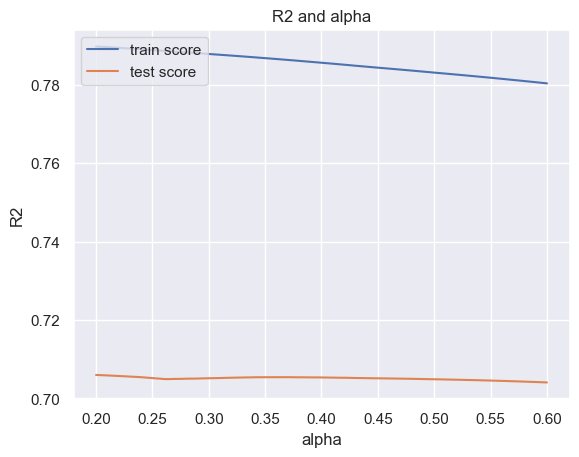

In [263]:
# plotting mean test and train scoes with alpha
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [264]:
print(model_cv.best_params_)
print(model_cv.best_score_)

{'alpha': 0.2}
0.7059929128302368


In [265]:
alpha = 0.2

lasso1 = Lasso(alpha=alpha)

lasso1.fit(X_train, y_train)

Lasso(alpha=0.2)

In [266]:
sorted(zip(lasso1.coef_,X))

[(-0.0043590866744958115, 'ActualAge'),
 (-0.0017436035770992857, 'PoolArea'),
 (-0.0005629242421131725, 'MSSubClass'),
 (-1.6239205899667642e-07, 'BsmtUnfSF'),
 (0.0, '1stFlrSF'),
 (-0.0, 'BedroomAbvGr'),
 (-0.0, 'BldgType_2fmCon'),
 (-0.0, 'BldgType_Duplex'),
 (-0.0, 'BldgType_Twnhs'),
 (0.0, 'BldgType_TwnhsE'),
 (0.0, 'BsmtCond_Gd'),
 (-0.0, 'BsmtCond_None'),
 (-0.0, 'BsmtCond_Po'),
 (0.0, 'BsmtCond_TA'),
 (0.0, 'BsmtExposure_Gd'),
 (0.0, 'BsmtExposure_Mn'),
 (-0.0, 'BsmtExposure_No'),
 (-0.0, 'BsmtExposure_None'),
 (-0.0, 'BsmtFinType1_BLQ'),
 (0.0, 'BsmtFinType1_GLQ'),
 (-0.0, 'BsmtFinType1_LwQ'),
 (-0.0, 'BsmtFinType1_None'),
 (-0.0, 'BsmtFinType1_Rec'),
 (-0.0, 'BsmtFinType1_Unf'),
 (-0.0, 'BsmtFinType2_BLQ'),
 (0.0, 'BsmtFinType2_GLQ'),
 (0.0, 'BsmtFinType2_LwQ'),
 (-0.0, 'BsmtFinType2_None'),
 (-0.0, 'BsmtFinType2_Rec'),
 (0.0, 'BsmtFinType2_Unf'),
 (0.0, 'BsmtFullBath'),
 (0.0, 'BsmtHalfBath'),
 (0.0, 'BsmtQual_Fa'),
 (0.0, 'BsmtQual_Gd'),
 (-0.0, 'BsmtQual_None'),
 (-0.0, 'B

In [274]:
print("X_train", X_train.shape)
print("y_train", y_train.shape)

X_train (1021, 205)
y_train (1021,)


In [382]:
# # list of alphas to tune
# params1 = {'alpha': [0.0000001,0.000001,0.00001,0.0001, 0.001, 0.01, 0.05, 0.1,
#  0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
#  4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

In [433]:
X_train=X_train1
X_train.shape

(1021, 205)

### List of alphas to tune

In [434]:

params1 = {'alpha': [0.0000001,0.000001,0.00001,0.0001, 0.001, 0.01, 0.05, 0.1,
 0.2, 0.3, 0.4, 0.5]}

In [435]:
lasso2 = Lasso()

# cross validation
folds = 5
model_cv1 = GridSearchCV(estimator = lasso2,
                        param_grid = params1,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv1.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01,
                                   0.05, 0.1, 0.2, 0.3, 0.4, 0.5]},
             return_train_score=True, scoring='r2', verbose=1)

In [436]:
cv_results1 = pd.DataFrame(model_cv1.cv_results_)
cv_results1.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.078234,0.000725,0.000000,0.000000,0.0,{'alpha': 1e-07},0.858902,0.880057,0.842907,0.700651,0.874223,0.831348,0.066611,5,0.930960,0.932299,0.940382,0.941862,0.930594,0.935220,0.004875
1,0.077053,0.010373,0.003125,0.006250,0.000001,{'alpha': 1e-06},0.859200,0.879968,0.843107,0.700819,0.874617,0.831542,0.066615,4,0.930958,0.932298,0.940381,0.941861,0.930593,0.935218,0.004875
2,0.086332,0.022607,0.003125,0.006250,0.00001,{'alpha': 1e-05},0.861347,0.880011,0.844835,0.701786,0.877555,0.833107,0.066867,3,0.930898,0.932253,0.940306,0.941774,0.930538,0.935154,0.004862
3,0.073426,0.009715,0.000401,0.000802,0.0001,{'alpha': 0.0001},0.874329,0.883579,0.851290,0.700606,0.897308,0.841423,0.071986,1,0.928655,0.930368,0.937411,0.939400,0.927481,0.932663,0.004819
4,0.015697,0.000158,0.000000,0.000000,0.001,{'alpha': 0.001},0.879790,0.882697,0.844706,0.677898,0.907098,0.838438,0.082699,2,0.903426,0.907125,0.916756,0.921153,0.902611,0.910214,0.007428


In [437]:
print(model_cv1.best_params_)
print(model_cv1.best_score_)

{'alpha': 0.0001}
0.8414225320433653


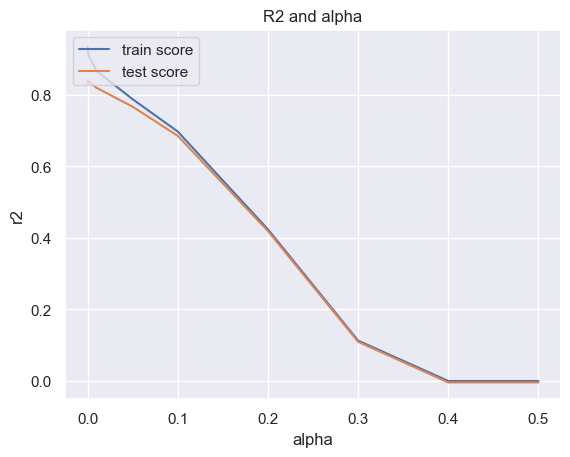

In [438]:
cv_results1['param_alpha'] = cv_results1['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results1['param_alpha'], cv_results1['mean_train_score'])
plt.plot(cv_results1['param_alpha'], cv_results1['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

**As observed from the plot that as aplha value increases getting more penalised and tending all coefficients to zero**
### Lets tune to find optimal aplha value where to find significant coefficients

In [439]:
alpha = 0.3

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
lasso.coef_

array([-0.        ,  0.        ,  0.02952235, -0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        , -0.        ,  0.        ,  0.        , -0.        ,
        0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        , -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
       -0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        , -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [440]:
alpha = 0.02

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
sorted(list(zip(lasso.coef_,X_train)))

array([-1.41578845e-02,  5.73819848e-03,  1.32705756e-01,  3.27087146e-02,
        0.00000000e+00,  3.98231851e-03,  0.00000000e+00, -0.00000000e+00,
        3.08448579e-02,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        1.06370034e-01,  2.26587174e-02,  0.00000000e+00,  6.21322227e-03,
        0.00000000e+00,  0.00000000e+00, -1.28682599e-04,  0.00000000e+00,
        2.68710759e-02,  0.00000000e+00,  5.63796516e-02,  8.18022694e-04,
        6.97717386e-03,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -9.94027022e-03, -0.00000000e+00, -8.09702677e-02,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -

In [421]:
alpha = 0.01

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
lasso.coef_

array([-0.02157339,  0.01098783,  0.12605815,  0.04618463,  0.        ,
        0.0074183 ,  0.        , -0.        ,  0.03050742,  0.        ,
        0.        , -0.        ,  0.11116766,  0.03046738,  0.        ,
        0.0144298 ,  0.00079796,  0.        , -0.0080618 ,  0.00604497,
        0.02798486,  0.        ,  0.05599777,  0.00103248,  0.0089573 ,
        0.        ,  0.        ,  0.        ,  0.0038095 , -0.0236821 ,
       -0.        , -0.08971107,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [422]:
sorted(list(zip(lasso.coef_,X_train)))

[(-0.08971106998198247, 'ActualAge'),
 (-0.023682103634139407, 'PoolArea'),
 (-0.02157339161585458, 'MSSubClass'),
 (-0.008061798631824445, 'KitchenAbvGr'),
 (0.0, '1stFlrSF'),
 (0.0, '2ndFlrSF'),
 (0.0, '3SsnPorch'),
 (0.0, 'BedroomAbvGr'),
 (0.0, 'BldgType_2fmCon'),
 (-0.0, 'BldgType_Duplex'),
 (-0.0, 'BldgType_Twnhs'),
 (0.0, 'BldgType_TwnhsE'),
 (0.0, 'BsmtCond_Gd'),
 (-0.0, 'BsmtCond_None'),
 (0.0, 'BsmtCond_Po'),
 (0.0, 'BsmtCond_TA'),
 (0.0, 'BsmtExposure_Gd'),
 (0.0, 'BsmtExposure_Mn'),
 (-0.0, 'BsmtExposure_No'),
 (-0.0, 'BsmtExposure_None'),
 (0.0, 'BsmtFinSF2'),
 (0.0, 'BsmtFinType1_BLQ'),
 (0.0, 'BsmtFinType1_GLQ'),
 (-0.0, 'BsmtFinType1_LwQ'),
 (-0.0, 'BsmtFinType1_None'),
 (-0.0, 'BsmtFinType1_Rec'),
 (-0.0, 'BsmtFinType1_Unf'),
 (-0.0, 'BsmtFinType2_BLQ'),
 (-0.0, 'BsmtFinType2_GLQ'),
 (0.0, 'BsmtFinType2_LwQ'),
 (-0.0, 'BsmtFinType2_None'),
 (-0.0, 'BsmtFinType2_Rec'),
 (0.0, 'BsmtFinType2_Unf'),
 (0.0, 'BsmtHalfBath'),
 (-0.0, 'BsmtQual_Fa'),
 (0.0, 'BsmtQual_Gd'),
 (-

In [423]:
model_parameters = list(lasso.coef_ )
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 12.029),
 ('MSSubClass', -0.022),
 ('LotArea', 0.011),
 ('OverallQual', 0.126),
 ('OverallCond', 0.046),
 ('MasVnrArea', 0.0),
 ('BsmtFinSF1', 0.007),
 ('BsmtFinSF2', 0.0),
 ('BsmtUnfSF', -0.0),
 ('TotalBsmtSF', 0.031),
 ('1stFlrSF', 0.0),
 ('2ndFlrSF', 0.0),
 ('LowQualFinSF', -0.0),
 ('GrLivArea', 0.111),
 ('BsmtFullBath', 0.03),
 ('BsmtHalfBath', 0.0),
 ('FullBath', 0.014),
 ('HalfBath', 0.001),
 ('BedroomAbvGr', 0.0),
 ('KitchenAbvGr', -0.008),
 ('TotRmsAbvGrd', 0.006),
 ('Fireplaces', 0.028),
 ('GarageYrBlt', 0.0),
 ('GarageCars', 0.056),
 ('GarageArea', 0.001),
 ('WoodDeckSF', 0.009),
 ('OpenPorchSF', 0.0),
 ('EnclosedPorch', 0.0),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 0.004),
 ('PoolArea', -0.024),
 ('MiscVal', -0.0),
 ('ActualAge', -0.09),
 ('MSZoning_FV', 0.0),
 ('MSZoning_RH', 0.0),
 ('MSZoning_RL', 0.0),
 ('MSZoning_RM', -0.0),
 ('LotShape_IR2', 0.0),
 ('LotShape_IR3', -0.0),
 ('LotShape_Reg', -0.0),
 ('LandContour_HLS', 0.0),
 ('LandContour_Low', 0.0),
 ('LandC

In [452]:
alpha = 0.02

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
sorted(list(zip(lasso.coef_,X_train)))

[(-0.08097026765135705, 'ActualAge'),
 (-0.014157884455725795, 'MSSubClass'),
 (-0.00994027021544726, 'PoolArea'),
 (-0.00012868259926837044, 'KitchenAbvGr'),
 (0.0, '1stFlrSF'),
 (0.0, '2ndFlrSF'),
 (0.0, '3SsnPorch'),
 (0.0, 'BedroomAbvGr'),
 (-0.0, 'BldgType_2fmCon'),
 (-0.0, 'BldgType_Duplex'),
 (-0.0, 'BldgType_Twnhs'),
 (-0.0, 'BldgType_TwnhsE'),
 (0.0, 'BsmtCond_Gd'),
 (-0.0, 'BsmtCond_None'),
 (0.0, 'BsmtCond_Po'),
 (0.0, 'BsmtCond_TA'),
 (0.0, 'BsmtExposure_Gd'),
 (0.0, 'BsmtExposure_Mn'),
 (-0.0, 'BsmtExposure_No'),
 (-0.0, 'BsmtExposure_None'),
 (0.0, 'BsmtFinSF2'),
 (0.0, 'BsmtFinType1_BLQ'),
 (0.0, 'BsmtFinType1_GLQ'),
 (-0.0, 'BsmtFinType1_LwQ'),
 (-0.0, 'BsmtFinType1_None'),
 (-0.0, 'BsmtFinType1_Rec'),
 (-0.0, 'BsmtFinType1_Unf'),
 (-0.0, 'BsmtFinType2_BLQ'),
 (-0.0, 'BsmtFinType2_GLQ'),
 (0.0, 'BsmtFinType2_LwQ'),
 (-0.0, 'BsmtFinType2_None'),
 (0.0, 'BsmtFinType2_Rec'),
 (0.0, 'BsmtFinType2_Unf'),
 (0.0, 'BsmtHalfBath'),
 (-0.0, 'BsmtQual_Fa'),
 (0.0, 'BsmtQual_Gd'),


In [442]:
alpha = 0.001

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
sorted(list(zip(lasso.coef_,X_train)))

[(-0.06630025621718706, 'Neighborhood_Edwards'),
 (-0.06324497311047551, 'ActualAge'),
 (-0.060536508624159976, 'Neighborhood_IDOTRR'),
 (-0.03699219795028225, 'BsmtFinType1_Unf'),
 (-0.03633278594730529, 'BldgType_Twnhs'),
 (-0.027803449054897043, 'GarageQual_Fa'),
 (-0.02647563124519931, 'FireplaceQu_None'),
 (-0.026442776931002835, 'PoolArea'),
 (-0.026156563975714715, 'HeatingQC_TA'),
 (-0.0223504199071912, 'MSSubClass'),
 (-0.019505707299125513, 'HeatingQC_Fa'),
 (-0.01631004156979642, 'Fence_GdWo'),
 (-0.016089209637266306, 'HouseStyle_2Story'),
 (-0.015153151174632479, 'BsmtQual_Gd'),
 (-0.013607023306647219, 'HeatingQC_Gd'),
 (-0.012353671003725858, 'KitchenAbvGr'),
 (-0.011088587542729563, 'LotShape_IR3'),
 (-0.010820576088179332, 'KitchenQual_TA'),
 (-0.009851975163057485, 'KitchenQual_Gd'),
 (-0.007665377655959174, 'GarageFinish_Unf'),
 (-0.006245945648616829, 'Exterior1st_Wd Sdng'),
 (-0.005194677136588117, 'BsmtExposure_No'),
 (-0.00506732320174411, 'LotConfig_Inside'),
 (

## Model building by dropping the  top five most important variable
# 'TotalBsmtSF', 'OverallCond', 'GarageCars', 'GrLivArea','OverallQual'

In [424]:
X_train.shape

(1021, 205)

In [425]:
X_train1=X_train

In [426]:
X_train1.shape

(1021, 205)

In [427]:
X_train=X_train.drop(['TotalBsmtSF', 'OverallCond', 'GarageCars', 'GrLivArea','OverallQual'],axis=1)
X_train.shape

(1021, 200)

In [428]:
lasso2 = Lasso()

# cross validation
folds = 5
model_cv1 = GridSearchCV(estimator = lasso2,
                        param_grid = params1,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv1.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01,
                                   0.05, 0.1, 0.2, 0.3, 0.4, 0.5]},
             return_train_score=True, scoring='r2', verbose=1)

In [429]:
cv_results1 = pd.DataFrame(model_cv1.cv_results_)
cv_results1.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.082056,0.005054,0.000000,0.000000,0.0,{'alpha': 1e-07},0.814897,0.867157,0.812746,0.656013,0.839203,0.798003,0.073680,4,0.920390,0.917655,0.930095,0.931572,0.919373,0.923817,0.005814
1,0.073419,0.006400,0.001901,0.003802,0.000001,{'alpha': 1e-06},0.815297,0.867075,0.812852,0.656263,0.839475,0.798192,0.073621,3,0.920386,0.917651,0.930093,0.931571,0.919372,0.923815,0.005815
2,0.077413,0.008243,0.000000,0.000000,0.00001,{'alpha': 1e-05},0.818336,0.868177,0.813703,0.659420,0.842041,0.800335,0.073078,2,0.920284,0.917556,0.930018,0.931493,0.919307,0.923732,0.005820
3,0.030889,0.008982,0.000600,0.001200,0.0001,{'alpha': 0.0001},0.830189,0.872658,0.815532,0.663704,0.859389,0.808294,0.075088,1,0.917626,0.915128,0.926969,0.928713,0.916129,0.920913,0.005739
4,0.009694,0.008121,0.005635,0.006328,0.001,{'alpha': 0.001},0.838722,0.855925,0.805552,0.609107,0.880520,0.797965,0.097530,5,0.885292,0.886239,0.900986,0.903331,0.883988,0.891967,0.008385


In [430]:
print(model_cv1.best_params_)
print(model_cv1.best_score_)

{'alpha': 0.0001}
0.8082944990182476


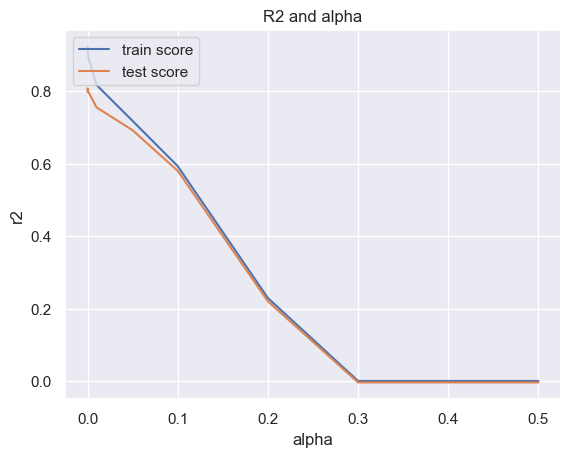

In [431]:
cv_results1['param_alpha'] = cv_results1['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results1['param_alpha'], cv_results1['mean_train_score'])
plt.plot(cv_results1['param_alpha'], cv_results1['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [387]:
alpha = 0.01

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
lasso.coef_

array([-0.00965636,  0.00610721,  0.00480102,  0.02321961,  0.        ,
        0.00722841,  0.10471058,  0.07680565,  0.        ,  0.01961811,
        0.        ,  0.03150867,  0.00941829,  0.        , -0.03977662,
        0.03647798,  0.04532959,  0.        ,  0.06796569,  0.01508553,
        0.        ,  0.        ,  0.        ,  0.00689249, -0.02405429,
        0.        , -0.08646679,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        , -0.        ,  0.        ,
        0.        , -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        , -0.        , -0.  

In [389]:
sorted(list(zip(lasso.coef_,X_train)))

[(-0.08646679022551575, 'ActualAge'),
 (-0.03977662168994828, 'KitchenAbvGr'),
 (-0.03746384189780902, 'KitchenQual_TA'),
 (-0.028462783114012607, 'ExterQual_TA'),
 (-0.02405428553452049, 'PoolArea'),
 (-0.015041128778186853, 'HeatingQC_TA'),
 (-0.009656357289096152, 'MSSubClass'),
 (0.0, '3SsnPorch'),
 (0.0, 'BedroomAbvGr'),
 (-0.0, 'BldgType_2fmCon'),
 (-0.0, 'BldgType_Duplex'),
 (-0.0, 'BldgType_Twnhs'),
 (0.0, 'BldgType_TwnhsE'),
 (0.0, 'BsmtCond_Gd'),
 (-0.0, 'BsmtCond_None'),
 (-0.0, 'BsmtCond_Po'),
 (0.0, 'BsmtCond_TA'),
 (0.0, 'BsmtExposure_Gd'),
 (0.0, 'BsmtExposure_Mn'),
 (-0.0, 'BsmtExposure_No'),
 (-0.0, 'BsmtExposure_None'),
 (0.0, 'BsmtFinSF2'),
 (-0.0, 'BsmtFinType1_BLQ'),
 (-0.0, 'BsmtFinType1_LwQ'),
 (-0.0, 'BsmtFinType1_None'),
 (-0.0, 'BsmtFinType1_Rec'),
 (-0.0, 'BsmtFinType1_Unf'),
 (-0.0, 'BsmtFinType2_BLQ'),
 (0.0, 'BsmtFinType2_GLQ'),
 (0.0, 'BsmtFinType2_LwQ'),
 (-0.0, 'BsmtFinType2_None'),
 (-0.0, 'BsmtFinType2_Rec'),
 (0.0, 'BsmtFinType2_Unf'),
 (0.0, 'BsmtHa

In [370]:
lm = Lasso(alpha=0.01)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.8621066655771449
0.8442198622944026


In [525]:
alpha = 0.02

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
sorted(list(zip(lasso.coef_,X_train)))

[(-0.08097026765135705, 'ActualAge'),
 (-0.014157884455725795, 'MSSubClass'),
 (-0.00994027021544726, 'PoolArea'),
 (-0.00012868259926837044, 'KitchenAbvGr'),
 (0.0, '1stFlrSF'),
 (0.0, '2ndFlrSF'),
 (0.0, '3SsnPorch'),
 (0.0, 'BedroomAbvGr'),
 (-0.0, 'BldgType_2fmCon'),
 (-0.0, 'BldgType_Duplex'),
 (-0.0, 'BldgType_Twnhs'),
 (-0.0, 'BldgType_TwnhsE'),
 (0.0, 'BsmtCond_Gd'),
 (-0.0, 'BsmtCond_None'),
 (0.0, 'BsmtCond_Po'),
 (0.0, 'BsmtCond_TA'),
 (0.0, 'BsmtExposure_Gd'),
 (0.0, 'BsmtExposure_Mn'),
 (-0.0, 'BsmtExposure_No'),
 (-0.0, 'BsmtExposure_None'),
 (0.0, 'BsmtFinSF2'),
 (0.0, 'BsmtFinType1_BLQ'),
 (0.0, 'BsmtFinType1_GLQ'),
 (-0.0, 'BsmtFinType1_LwQ'),
 (-0.0, 'BsmtFinType1_None'),
 (-0.0, 'BsmtFinType1_Rec'),
 (-0.0, 'BsmtFinType1_Unf'),
 (-0.0, 'BsmtFinType2_BLQ'),
 (-0.0, 'BsmtFinType2_GLQ'),
 (0.0, 'BsmtFinType2_LwQ'),
 (-0.0, 'BsmtFinType2_None'),
 (0.0, 'BsmtFinType2_Rec'),
 (0.0, 'BsmtFinType2_Unf'),
 (0.0, 'BsmtHalfBath'),
 (-0.0, 'BsmtQual_Fa'),
 (0.0, 'BsmtQual_Gd'),


In [524]:
lm = Lasso(alpha=0.02)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.8462092791824911
0.8465388299842382


In [491]:
lm = Lasso(alpha=0.01)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print((mean_squared_error(y_true=y_train, y_pred=y_train_pred))*0.5)
y_test_pred = lm.predict(X_test)
print((mean_squared_error(y_true=y_test, y_pred=y_test_pred))*0.5)

0.011263837206319304
0.011723196243577996


## Ridge Regression

In [481]:

params2 = {'alpha': [0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100]}

In [502]:

params3 = {'alpha': [20, 50, 100,200,400,500,600,700,800,900,1000]}

In [503]:
# Applying Ridge
ridge = Ridge()

# cross validation
folds = 5
model_cv3= GridSearchCV(estimator = ridge,
                        param_grid = params3,
                        scoring= 'neg_mean_absolute_error',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)
model_cv3.fit(X_train, y_train)

Fitting 5 folds for each of 11 candidates, totalling 55 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [20, 50, 100, 200, 400, 500, 600, 700, 800,
                                   900, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [504]:
cv_resultsR = pd.DataFrame(model_cv3.cv_results_)
cv_resultsR = cv_resultsR[cv_resultsR['param_alpha']<=1000]
cv_resultsR.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.007654,0.002144,0.003496,0.000478,20,{'alpha': 20},-0.087786,-0.098475,-0.098315,-0.085301,-0.090098,-0.091995,0.005442,1,-0.082096,-0.079867,-0.074555,-0.075512,-0.081121,-0.078630,0.003036
1,0.004377,0.006125,0.003734,0.006080,50,{'alpha': 50},-0.087485,-0.101116,-0.098474,-0.085917,-0.090631,-0.092724,0.006028,2,-0.085720,-0.082462,-0.077794,-0.078922,-0.084168,-0.081813,0.003024
2,0.005224,0.006599,0.004221,0.006074,100,{'alpha': 100},-0.087545,-0.102934,-0.099604,-0.087419,-0.091240,-0.093749,0.006380,3,-0.088773,-0.084867,-0.080781,-0.082048,-0.087023,-0.084699,0.002980
3,0.004149,0.006071,0.005629,0.009459,200,{'alpha': 200},-0.088560,-0.104887,-0.102720,-0.089993,-0.093121,-0.095856,0.006690,4,-0.092516,-0.088466,-0.084939,-0.085855,-0.090796,-0.088514,0.002866
4,0.008153,0.007023,0.001302,0.002604,400,{'alpha': 400},-0.091655,-0.107166,-0.108053,-0.093373,-0.097172,-0.099484,0.006876,5,-0.097636,-0.093607,-0.090498,-0.091157,-0.095883,-0.093756,0.002719


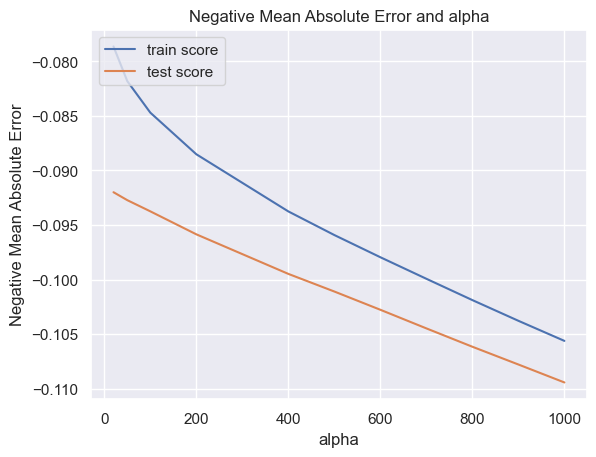

In [505]:
# plotting mean test and train scoes with alpha
cv_resultsR['param_alpha'] = cv_resultsR['param_alpha'].astype('int32')

# plotting
plt.plot(cv_resultsR['param_alpha'], cv_resultsR['mean_train_score'])
plt.plot(cv_resultsR['param_alpha'], cv_resultsR['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [506]:
print(model_cv3.best_params_)
print(model_cv3.best_score_)

{'alpha': 20}
-0.09199507915958507


In [534]:
alpha = 200
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
sorted(list(zip(ridge.coef_,X_train)))

[(-0.04072855695133551, 'ActualAge'),
 (-0.023606738587039672, 'PoolArea'),
 (-0.02203691469600336, 'Neighborhood_Edwards'),
 (-0.019274683648884076, 'MSZoning_RM'),
 (-0.019045565880921475, 'HeatingQC_TA'),
 (-0.017674941365961434, 'BsmtFinType1_Unf'),
 (-0.01727639732991581, 'MSSubClass'),
 (-0.016862289452112496, 'KitchenQual_TA'),
 (-0.015332459085336507, 'KitchenAbvGr'),
 (-0.015046543609419843, 'Neighborhood_IDOTRR'),
 (-0.014257960287437742, 'FireplaceQu_None'),
 (-0.01360674104049488, 'ExterQual_TA'),
 (-0.011537788707244551, 'BsmtQual_TA'),
 (-0.010605238250309621, 'BsmtExposure_No'),
 (-0.010510538943795764, 'GarageFinish_Unf'),
 (-0.00883430668073506, 'BldgType_Twnhs'),
 (-0.008780768113725777, 'RoofStyle_Gable'),
 (-0.00869648626631688, 'Exterior1st_Wd Sdng'),
 (-0.008677914149613946, 'Condition1_Feedr'),
 (-0.008255283716901868, 'Neighborhood_OldTown'),
 (-0.008020200320948294, 'Foundation_CBlock'),
 (-0.00796161203752149, 'KitchenQual_Fa'),
 (-0.007936547195633834, 'Heati

In [531]:
lm = Ridge(alpha=200)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.8856277566438412
0.8595214768615316


In [521]:
alpha = 00
ridge = Ridge(alpha=alpha)

ridge.fit(X_train2, y_train)
sorted(list(zip(ridge.coef_,X_train2)))

[(-0.033888510791220045, 'ActualAge'),
 (-0.02538820393054238, 'KitchenQual_TA'),
 (-0.022924436743999552, 'ExterQual_TA'),
 (-0.01979308643470516, 'KitchenAbvGr'),
 (-0.01916871900169582, 'FireplaceQu_None'),
 (-0.018886559307815236, 'HeatingQC_TA'),
 (-0.0163760537882399, 'Neighborhood_Edwards'),
 (-0.015754117888914083, 'BsmtQual_TA'),
 (-0.014690793276425093, 'MSSubClass'),
 (-0.014466346190537636, 'Foundation_CBlock'),
 (-0.013690760525067808, 'PoolArea'),
 (-0.012129444673871186, 'MSZoning_RM'),
 (-0.011954346024175966, 'RoofStyle_Gable'),
 (-0.010633647267841651, 'BsmtFinType1_Unf'),
 (-0.010589641410964967, 'BsmtExposure_No'),
 (-0.010337791000739272, 'Neighborhood_IDOTRR'),
 (-0.010262396022219199, 'LotShape_Reg'),
 (-0.009801692692530232, 'GarageQual_None'),
 (-0.009801692692530228, 'GarageFinish_None'),
 (-0.009801692692530227, 'GarageType_None'),
 (-0.00957558820817549, 'GarageFinish_Unf'),
 (-0.007893441283015966, 'KitchenQual_Fa'),
 (-0.007663396555460173, 'GarageType_Det

In [532]:
X_train2=X_train.drop(['FullBath', 'GarageCars', 'GrLivArea', 'OverallCond','OverallQual'], axis=1)

In [526]:
lm = Ridge(alpha=100)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.8950239634130108
0.8606628840271975


In [496]:
lm = Ridge(alpha=1000)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print(r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(r2_score(y_true=y_test, y_pred=y_test_pred))

0.8470709477451527
0.8382768857365831


In [473]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [527]:
lm = Ridge(alpha=100)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print((mean_squared_error(y_true=y_train, y_pred=y_train_pred))*0.5)
y_test_pred = lm.predict(X_test)
print((mean_squared_error(y_true=y_test, y_pred=y_test_pred))*0.5)

0.008574982914362565
0.010485780656134683


In [477]:
import math

In [480]:
lm = Ridge(alpha=100)
lm.fit(X_train, y_train)

# prediction on the test set(Using R2)
y_train_pred = lm.predict(X_train)
print((mean_absolute_error(y_true=y_train, y_pred=y_train_pred))*0.5)
y_test_pred = lm.predict(X_test)
print((mean_absolute_error(y_true=y_test, y_pred=y_test_pred))*0.5)

0.04244829742976228
0.04675634480672509


In [485]:
X_train.shape

(1021, 205)